In [18]:
%matplotlib inline
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import PIL
from keras.preprocessing.image import load_img


import pickle
import time

In [19]:
inputShape = (224, 224)


In [2]:
df = pickle.load(open('Data/feature_matrix/DF20000_bbox.p','rb'))

In [4]:
fc6_full = pickle.load(open('Data/feature_matrix/FC6_full_trained.p','rb'))


In [5]:
from matplotlib.offsetbox import OffsetImage, AnnotationBbox

# Plots an image at each x and y location. 
def plotImage(x, y, image, ax):
    im = OffsetImage(load_img(image,target_size=inputShape), zoom=0.15)
    ab = AnnotationBbox(im, (x, y), xycoords='data', frameon=False)
    ax.add_artist(ab)

# Create figure
def plot_tsne(N,embed,image_df,file):
    fig = plt.figure(figsize=(20,20),dpi=300)
    ax = fig.add_subplot(111)

    for i in range(N):
        plotImage(embed[i,0],embed[i,1],
                  'Data/DeepFashion/'+image_df.iloc[i]['image_name'],ax)

    ax.set_ylim(np.min(embed[:N,1]),np.max(embed[:N,1]))
    ax.set_xlim(np.min(embed[:N,0]),np.max(embed[:N,0]))

    plt.savefig(file)

In [7]:
fc6_full[:10,:].shape

(10, 4096)

In [22]:
from sklearn.manifold import TSNE
tsne = TSNE()
fc6_full_embed2 = tsne.fit_transform(fc6_full[:5000])

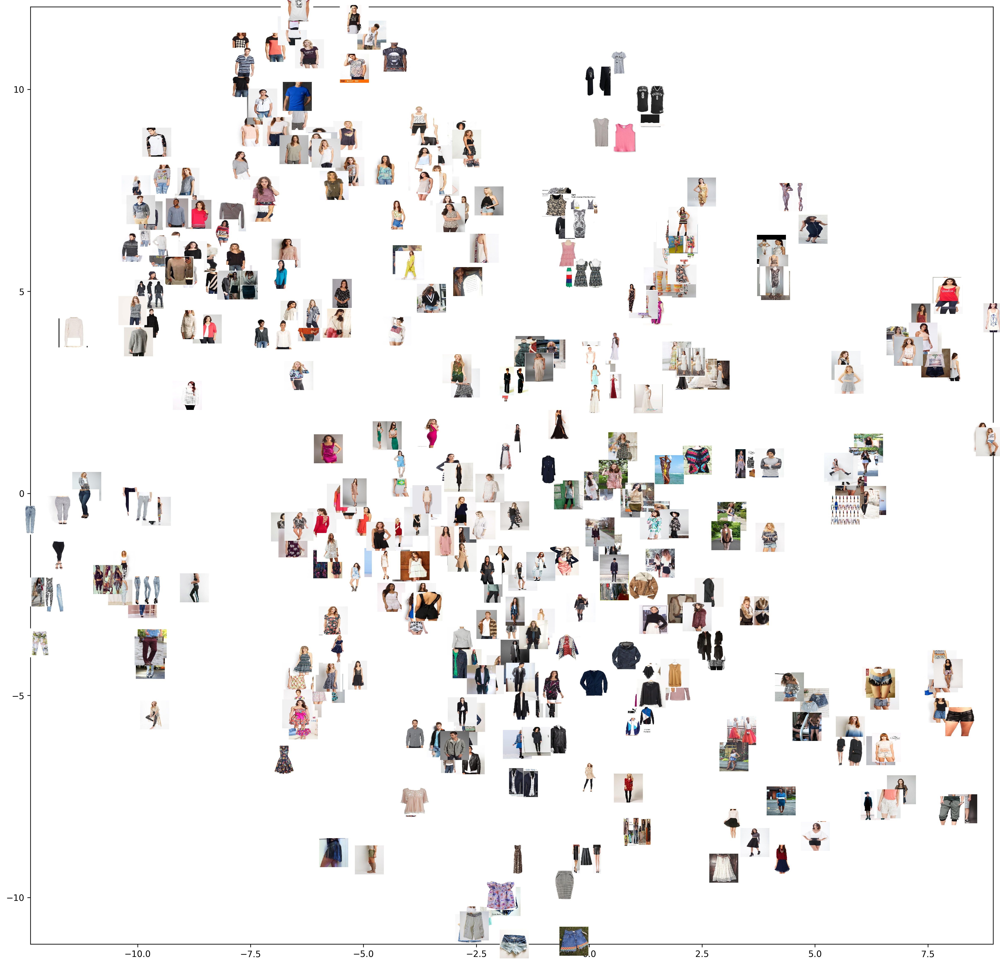

In [23]:
plot_tsne(400,fc6_full_embed2[:5000],df.iloc[:5000,:],'DF_5000_FC6_full_tsne2.png')

In [64]:
from PIL import ImageDraw
from keras.applications import imagenet_utils
from keras.preprocessing.image import img_to_array,array_to_img
from IPython.display import Image,display


inputShape = (224, 224)
preprocess = imagenet_utils.preprocess_input

def crop_resize_DF(bbox):
    img = PIL.Image.open('Data/DeepFashion/'+bbox['image_name'])
    lx = bbox['x_1']
    ly = bbox['y_1']
    ux = bbox['x_2']
    uy = bbox['y_2']
    
    img = img.crop((lx,ly,ux,uy))
    img = img.resize(inputShape, PIL.Image.ANTIALIAS)
    return img


def gen_matches(file,image_df,feature_matrix,model,k=1,metric='L2'):
    if metric == 'H':
        bin_mat = (feature_matrix > 0)
        
    img = preprocess_file(file)
    img_feature = model.predict(img)
    if metric == 'L2':
        dist = np.sum((feature_matrix-img_feature)**2,axis=1)
    elif metric == 'L1':
        dist = np.sum(np.abs(feature_matrix-img_feature),axis=1)
    elif metric == 'H':
        img_feature = (img_feature>0)
        dist = np.sum(np.logical_xor(img_feature,bin_mat),axis=1)
        
    j=1
    match = np.argsort(dist)[j:(j+k)]
    while dist[match[0]]<=0:
        j += 1
        match = np.argsort(dist)[j:(j+k)]
        
    display(PIL.Image.open(file).resize(inputShape, PIL.Image.ANTIALIAS))
    for m in match:
        display(PIL.Image.open('Data/DeepFashion/'+image_df.iloc[m]['image_name']))
        


def preprocess_file(file):
    image = PIL.Image.open(file).convert('RGB')
    image = image.resize(inputShape, PIL.Image.ANTIALIAS)
    image = img_to_array(image)
    image = np.expand_dims(image,axis=0)
    
    return preprocess(image)


In [32]:
from keras.models import load_model,Model

full_trained = load_model('Data/Trained Models/DF-Category-FULL-retrain.h5')
full_fc6 = Model(inputs=full_trained.input,outputs=full_trained.get_layer('fc1').output)

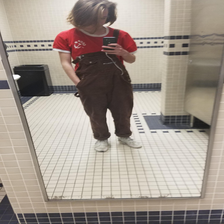

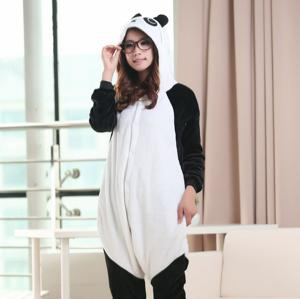

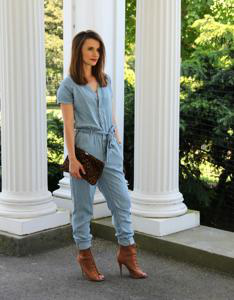

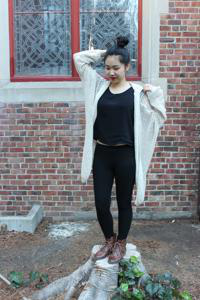

In [65]:
gen_matches('images/communist_overalls_public_restroom.jpg',df,fc6_full,full_fc6,k=3)

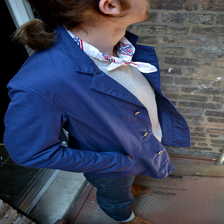

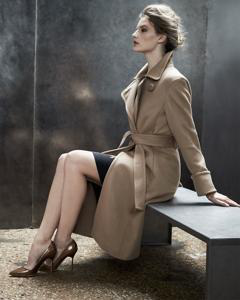

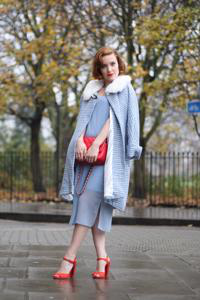

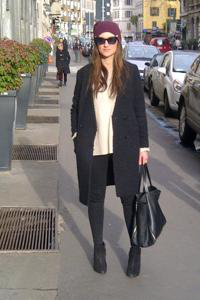

In [66]:
gen_matches('images/jacket.jpg',df,fc6_full,full_fc6,k=3)

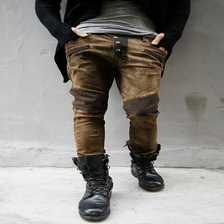

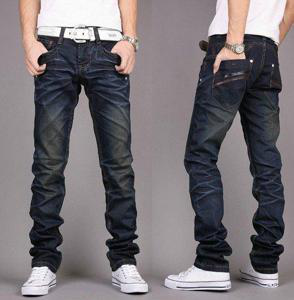

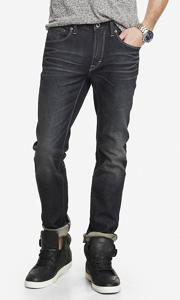

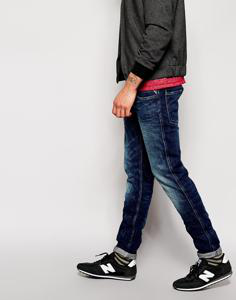

In [67]:
gen_matches('images/pants.jpg',df,fc6_full,full_fc6,k=3)

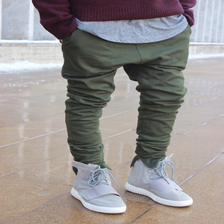

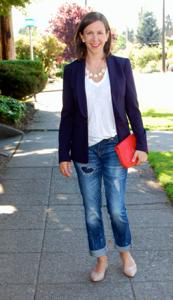

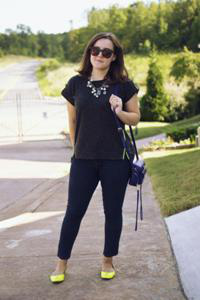

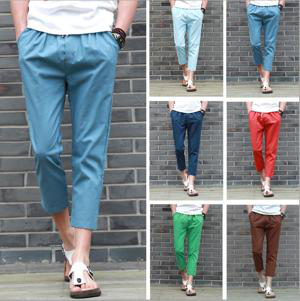

In [68]:
gen_matches('images/pants2.jpg',df,fc6_full,full_fc6,k=3)

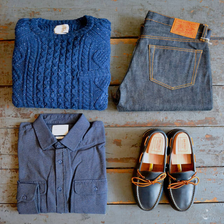

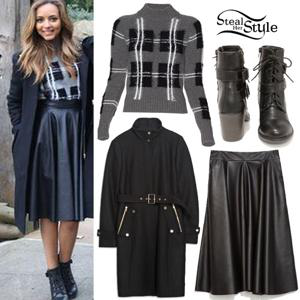

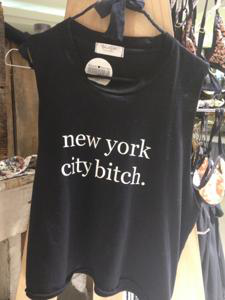

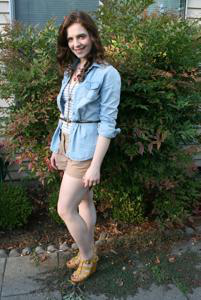

In [69]:
gen_matches('images/outfit.jpg',df,fc6_full,full_fc6,k=3)

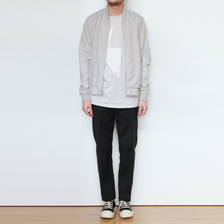

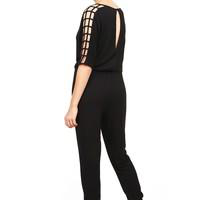

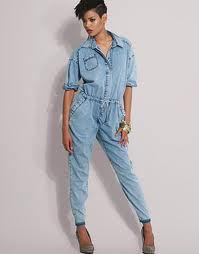

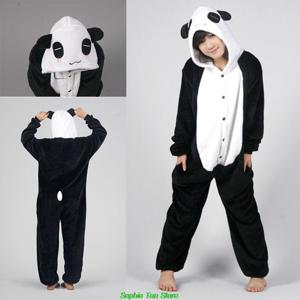

In [70]:
gen_matches('images/outfit2.jpg',df,fc6_full,full_fc6,k=3)

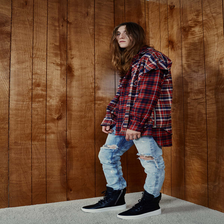

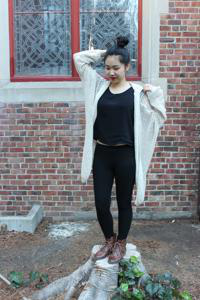

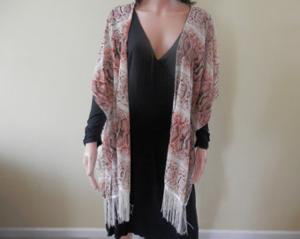

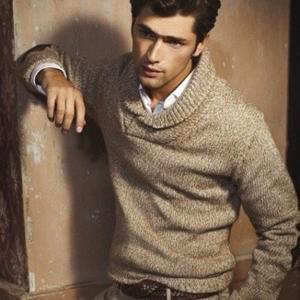

In [71]:
gen_matches('images/punk.jpg',df,fc6_full,full_fc6,k=3)

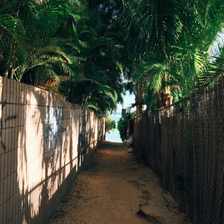

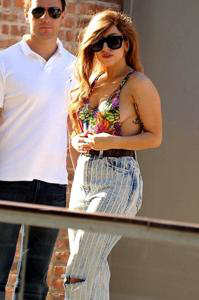

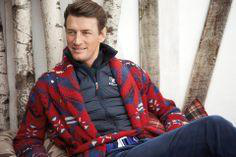

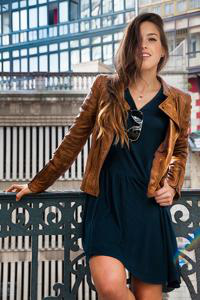

In [72]:
gen_matches('images/landscape.jpg',df,fc6_full,full_fc6,k=3)

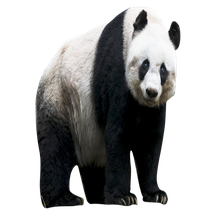

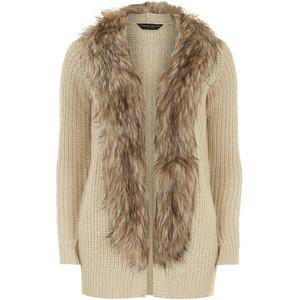

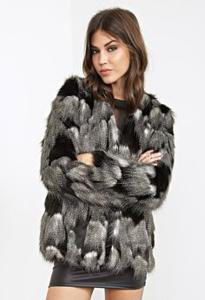

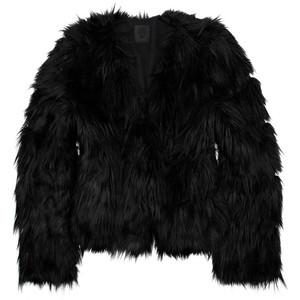

In [81]:
gen_matches('images/panda.png',df,fc6_full,full_fc6,k=3)

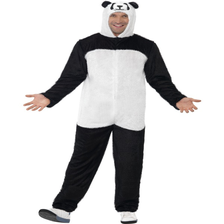

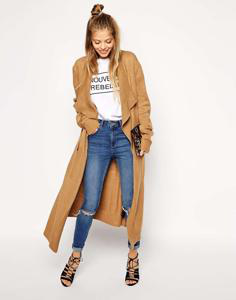

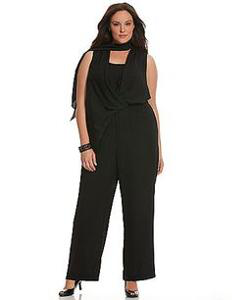

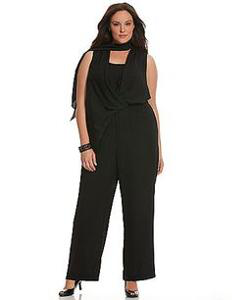

In [79]:
gen_matches('images/panda2.jpg',df,fc6_full,full_fc6,k=3,metric='H')

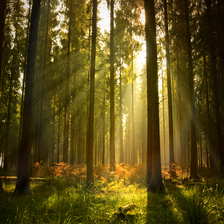

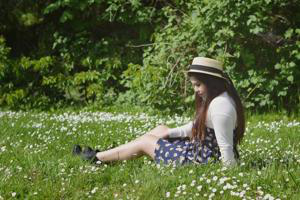

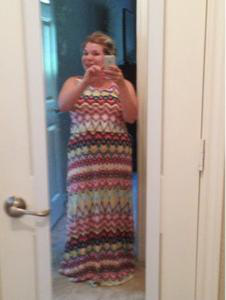

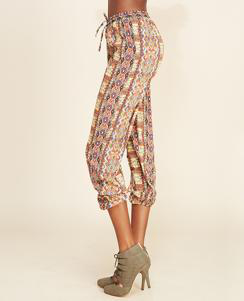

In [87]:
gen_matches('images/forest.jpg',df,fc6_full,full_fc6,k=3)

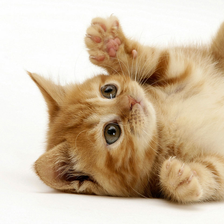

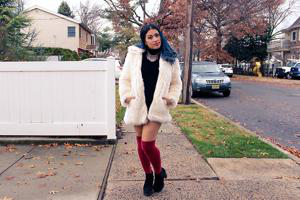

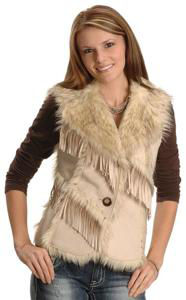

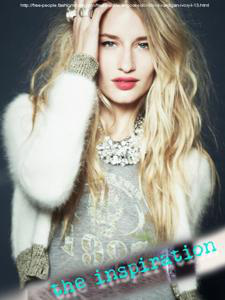

In [88]:
gen_matches('images/kitty.jpg',df,fc6_full,full_fc6,k=3)

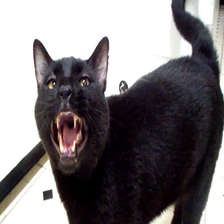

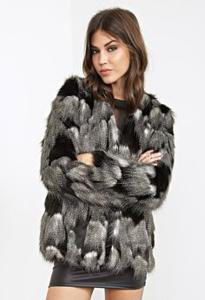

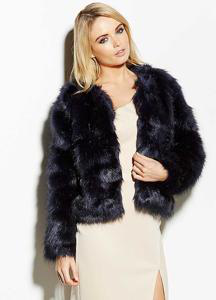

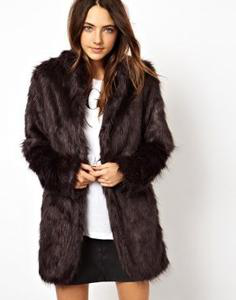

In [89]:
gen_matches('images/kitty2.jpg',df,fc6_full,full_fc6,k=3)

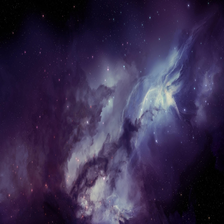

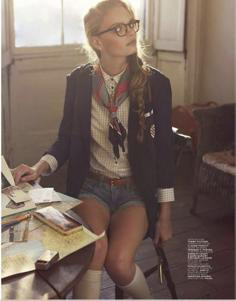

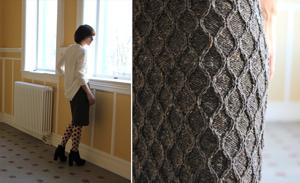

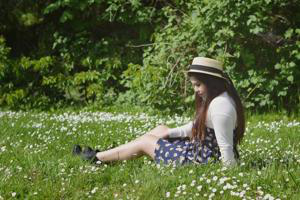

In [93]:
gen_matches('images/space.jpg',df,fc6_full,full_fc6,k=3)

In [96]:
def draw_bbox(bbox):
    img = PIL.Image.open('Data/DeepFashion/'+bbox['image_name']).convert('RGBA')
    
    lx = bbox['x_1']
    ly = bbox['y_1']
    ux = bbox['x_2']
    uy = bbox['y_2']
    rect = PIL.Image.new('RGBA', img.size, (255,255,255,0))
    d = ImageDraw.Draw(img)
    d.rectangle(((lx,ly), (ux,uy)), outline="red")
    return PIL.Image.alpha_composite(img,rect)

def gen_pairs(N,image_df,feature_matrix,metric='L2'):
    img_index = np.random.randint(image_df.shape[0],size=N)
    if metric == 'H':
        bin_mat = (feature_matrix > 0)
    for i in img_index:
        img_feature = feature_matrix[i,:]
        if metric == 'L2':
            dist = np.sum((feature_matrix-img_feature)**2,axis=1)
        elif metric == 'L1':
            dist = np.sum(np.abs(feature_matrix-img_feature),axis=1)
        elif metric == 'H':
            img_feature = (img_feature>0)
            dist = np.sum(np.logical_xor(img_feature,bin_mat),axis=1)
        
        j=1
        match = np.argsort(dist)[j]
        while dist[match]<=0:
            j += 1
            match = np.argsort(dist)[j]

        display(draw_bbox(image_df.iloc[i]))
        display(draw_bbox(image_df.iloc[match]))

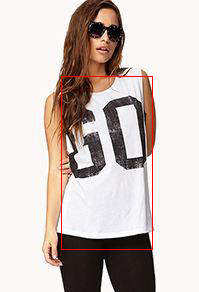

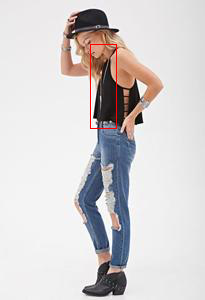

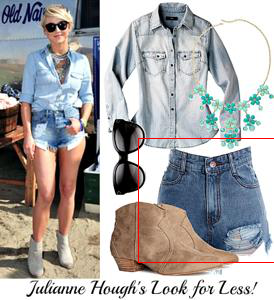

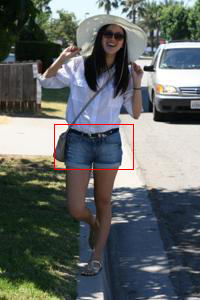

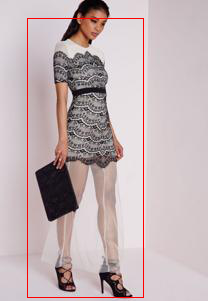

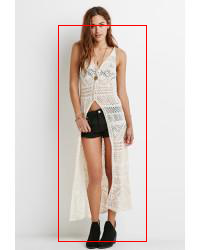

In [110]:
gen_pairs(3,df,fc6_full)